In [1]:
#pip install missingpy
#pip install autoimpute
#!pip install pyts
#!pip install impyute

In [2]:
from missingpy import MissForest

F:\DataScience\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
import pandas as pd

In [4]:
df=pd.read_csv('Week8.csv')
df.head()

,Days,M1,T1,W1,TH1,F1,M2,T2,W2,TH2,...,M7,T7,W7,TH7,F7,M8,T8,W8,TH8,F8
0,1,4,5,5,6,7,1,2,3,4,...,2,3,4,5,6,5.0,6.0,7.0,8.0,8.0
1,2,1,2,3,4,5,5,5,6,6,...,4,5,6,7,8,3.0,NaN,5.0,6.0,7.0
2,3,3,4,5,6,7,2,3,4,5,...,2,3,4,5,6,5.0,NaN,7.0,8.0,8.0
3,4,1,2,3,4,5,1,2,3,4,...,5,6,7,7,8,NaN,5.0,6.0,7.0,8.0
4,5,2,3,4,5,6,5,5,6,6,...,1,2,3,4,5,NaN,6.0,7.0,8.0,8.0


In [5]:
df1=df[['M8','T8','W8','TH8','F8']]

In [6]:
df1.describe()

,M8,T8,W8,TH8,F8
count,824.000000,816.000000,806.000000,804.000000,793.000000
mean,3.444175,4.253676,5.001241,5.863184,6.490542
std,1.691028,1.742465,1.651274,1.738492,1.541586
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,4.000000,5.000000,5.000000
50%,3.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,7.000000,8.000000,8.000000
max,6.000000,7.000000,7.000000,8.000000,8.000000


# REGRESSION

In [7]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp_mice = IterativeImputer(n_nearest_features=5)
df_mice=imp_mice.fit_transform(df1)
df_mice=pd.DataFrame(df_mice,columns=df1.columns)
df_mice.describe()

F:\DataScience\lib\site-packages\sklearn\impute\_iterative.py:669: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn("[IterativeImputer] Early stopping criterion not"


,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.434532,4.291425,5.039617,5.918081,6.522657
std,1.684503,1.741854,1.637957,1.725322,1.515950
min,0.605756,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,4.000000,5.000000,5.128468
50%,3.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,7.000000,7.983480,8.000000
max,6.484050,7.000000,7.196452,8.000000,8.320255


# RANDOM FOREST

In [8]:
imp_rf=MissForest()
df_rf=imp_rf.fit_transform(df1)
df_rf=pd.DataFrame(df_rf,columns=df1.columns)
df_rf.describe()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4


,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.429193,4.293301,5.036417,5.852395,6.473507
std,1.688248,1.744926,1.640210,1.665263,1.484890
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,4.000000,5.000000,5.000000
50%,3.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,7.000000,7.000000,8.000000
max,6.000000,7.000000,7.000000,8.000000,8.000000


In [9]:
from pyts.preprocessing import InterpolationImputer
import numpy as np

# INTERPOLATION TECHNIQUES

In [10]:
imp_linear=InterpolationImputer(missing_values=np.nan,strategy='linear')
imp_nearest=InterpolationImputer(missing_values=np.nan,strategy='nearest')
imp_quadratic=InterpolationImputer(missing_values=np.nan,strategy='quadratic')
imp_previous=InterpolationImputer(missing_values=np.nan,strategy='previous')
imp_next=InterpolationImputer(missing_values=np.nan,strategy='next')

In [11]:
df_linear=imp_linear.transform(df1)
df_nearest=imp_nearest.transform(df1)
df_quadratic=imp_quadratic.transform(df1)
df_previous=imp_previous.transform(df1)
df_next=imp_next.transform(df1)

In [12]:
df_linear=pd.DataFrame(df_linear,columns=df1.columns)
df_linear.describe()

,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,3.461000,4.286833,5.047833,5.892333,6.54100
std,1.737814,1.727801,1.651471,1.705036,1.57076
min,0.500000,1.000000,1.000000,1.000000,1.00000
25%,2.000000,3.000000,4.000000,5.000000,5.00000
50%,3.000000,4.000000,5.000000,6.000000,7.00000
75%,5.000000,6.000000,7.000000,8.000000,8.00000
max,7.000000,7.000000,7.333333,8.000000,9.00000


In [13]:
df_nearest=pd.DataFrame(df_nearest,columns=df1.columns)
df_nearest.describe()

,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.592000,4.131000,4.919000,5.738000,6.329000
std,1.724096,1.758673,1.734776,1.732154,1.546334
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,3.750000,4.000000,5.000000
50%,4.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,7.000000,7.000000,8.000000
max,7.000000,7.000000,8.000000,8.000000,8.000000


In [14]:
df_quadratic=pd.DataFrame(df_quadratic,columns=df1.columns)
df_quadratic.describe()

,M8,T8,W8,TH8,F8
count,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.504500e+00,4.299895,5.064167,5.870184,6.486333
std,1.837131e+00,1.744895,1.674147,1.705513,1.657761
min,-1.110223e-16,1.000000,1.000000,1.000000,-1.000000
25%,2.000000e+00,3.000000,4.000000,5.000000,5.000000
50%,3.000000e+00,4.000000,5.000000,6.000000,7.000000
75%,5.000000e+00,6.000000,7.000000,8.000000,8.000000
max,1.000000e+01,8.000000,7.666667,9.000000,12.000000


In [15]:
df_previous=pd.DataFrame(df_previous,columns=df1.columns)
df_previous.describe()

,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.592000,4.131000,4.849000,5.727000,6.329000
std,1.724096,1.758673,1.661614,1.736516,1.546334
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,3.000000,4.000000,5.000000
50%,4.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,6.000000,7.000000,8.000000
max,7.000000,7.000000,7.000000,8.000000,8.000000


In [16]:
df_next=pd.DataFrame(df_next,columns=df1.columns)
df_next.describe()

,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.592000,4.472000,5.227000,5.952000,6.329000
std,1.724096,1.804015,1.706571,1.667476,1.546334
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,4.000000,5.000000,5.000000
50%,4.000000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,7.000000,7.000000,8.000000
max,7.000000,8.000000,8.000000,8.000000,8.000000


# MOVING AVERAGE

In [17]:
df_moving_avg=df1.fillna(df1.rolling(6,min_periods=1).mean())
df_moving_avg.describe()

,M8,T8,W8,TH8,F8
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.436867,4.270183,5.037750,5.870433,6.500050
std,1.569135,1.631584,1.542424,1.631628,1.459394
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,4.000000,5.000000,5.600000
50%,3.200000,4.000000,5.000000,6.000000,7.000000
75%,5.000000,6.000000,6.200000,7.000000,8.000000
max,6.000000,7.000000,7.000000,8.000000,8.000000


In [18]:
import impyute as impy

In [30]:
df1_array=np.array(df1)

In [31]:
import scipy.sparse as sp
df1_matrix=sp.csc_matrix(df1_array)

# PROBABILITY DISTRIBUTION

In [34]:
df_prob=impy.em(df1_array)

In [36]:
df_em=pd.DataFrame(df_prob)

In [37]:
df_em.describe()

,0,1,2,3,4
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.343561,4.135141,4.897962,5.750772,6.331395
std,1.650575,1.693967,1.619553,1.698665,1.546424
min,-0.943669,0.428918,0.591559,1.000000,1.000000
25%,2.000000,3.000000,4.000000,4.540316,5.000000
50%,3.000000,4.000000,5.000000,6.000000,6.456343
75%,5.000000,5.855765,6.028312,7.000000,8.000000
max,6.000000,7.570077,8.005955,8.192174,8.987949


In [47]:
df_moving_avg=df_moving_avg.round(0)
import matplotlib.pyplot as plt

# CLUSTERING

In [42]:
df_Monday=[df['M1'],df['M2'],df['M3'],df['M4'],df['M5'],df['M6'],df['M7'],df_moving_avg['M8']]
df_Monday=pd.DataFrame(df_Monday)
df_Monday=df_Monday.T
df_Monday

,M1,M2,M3,M4,M5,M6,M7,M8
0,4.0,1.0,3.0,4.0,5.0,4.0,2.0,5.0
1,1.0,5.0,3.0,6.0,3.0,4.0,4.0,3.0
2,3.0,2.0,5.0,2.0,3.0,5.0,2.0,5.0
3,1.0,1.0,1.0,4.0,4.0,2.0,5.0,4.0
4,2.0,5.0,5.0,4.0,3.0,4.0,1.0,4.0
...,...,...,...,...,...,...,...,...
995,2.0,1.0,5.0,6.0,1.0,6.0,3.0,6.0
996,5.0,2.0,1.0,5.0,6.0,4.0,6.0,3.0
997,1.0,4.0,4.0,5.0,5.0,6.0,4.0,1.0
998,1.0,1.0,5.0,3.0,4.0,3.0,1.0,1.0


In [43]:
from sklearn.decomposition import PCA

# Feature matrix and target array
X = df_Monday

# PCA
pca = PCA(n_components=2)

# Fit and transform
principalComponents = pca.fit_transform(X)

# Print ratio of variance explained
print(pca.explained_variance_ratio_)

[0.1596975  0.15228956]


In [44]:
Monday=pd.DataFrame(principalComponents)

In [45]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For loop
for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters)
    # Fit and predict your k-Means object
    preds = kmeans.fit_predict(Monday)
    score = silhouette_score(Monday, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.32173742541968403)
For n_clusters = 3, silhouette score is 0.34762872549989304)
For n_clusters = 4, silhouette score is 0.3396848923703538)
For n_clusters = 5, silhouette score is 0.3295364389110149)
For n_clusters = 6, silhouette score is 0.3456538888073561)
For n_clusters = 7, silhouette score is 0.33959537584376753)
For n_clusters = 8, silhouette score is 0.33340111970292646)
For n_clusters = 9, silhouette score is 0.33804853453988615)


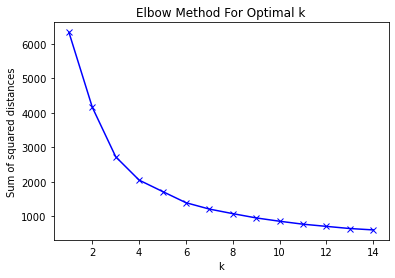

In [48]:
sum_of_squared_distances = []

# Create for loop
for k in range(1,15):
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(Monday)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot
plt.plot(range(1,15), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [49]:
kmeans_monday=KMeans(n_clusters=3, random_state=123)
kmeans_monday.fit(Monday)
pred_monday=kmeans_monday.predict(Monday)

In [64]:
df_moving_avg['cluster_Monday']= pred_monday

In [51]:
df_Tuesday=[df['T1'],df['T2'],df['T3'],df['T4'],df['T5'],df['T6'],df['T7'],df_moving_avg['T8']]
df_Tuesday=pd.DataFrame(df_Tuesday)
df_Tuesday=df_Tuesday.T
df_Tuesday

,T1,T2,T3,T4,T5,T6,T7,T8
0,5.0,2.0,4.0,5.0,6.0,5.0,3.0,6.0
1,2.0,5.0,4.0,6.0,4.0,5.0,5.0,6.0
2,4.0,3.0,6.0,3.0,4.0,6.0,3.0,6.0
3,2.0,2.0,2.0,5.0,5.0,3.0,6.0,5.0
4,3.0,5.0,6.0,5.0,4.0,5.0,2.0,6.0
...,...,...,...,...,...,...,...,...
995,3.0,2.0,6.0,6.0,1.0,6.0,3.0,6.0
996,5.0,2.0,1.0,5.0,7.0,4.0,6.0,4.0
997,1.0,4.0,4.0,5.0,5.0,6.0,5.0,1.0
998,1.0,1.0,6.0,3.0,4.0,3.0,1.0,1.0


In [52]:
from sklearn.decomposition import PCA

# Feature matrix and target array
X = df_Tuesday

# PCA
pca = PCA(n_components=2)

# Fit and transform
principalComponents = pca.fit_transform(X)

# Print ratio of variance explained
print(pca.explained_variance_ratio_)

[0.17980608 0.15110089]


In [53]:
Tuesday=pd.DataFrame(principalComponents)

In [54]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For loop
for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters)
    # Fit and predict your k-Means object
    preds = kmeans.fit_predict(Tuesday)
    score = silhouette_score(Tuesday, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.3730956799176383)
For n_clusters = 3, silhouette score is 0.3755937206546884)
For n_clusters = 4, silhouette score is 0.3845057384827145)
For n_clusters = 5, silhouette score is 0.3720938971314848)
For n_clusters = 6, silhouette score is 0.3677370969145351)
For n_clusters = 7, silhouette score is 0.354405506071158)
For n_clusters = 8, silhouette score is 0.3530896142370874)
For n_clusters = 9, silhouette score is 0.3537495164905698)


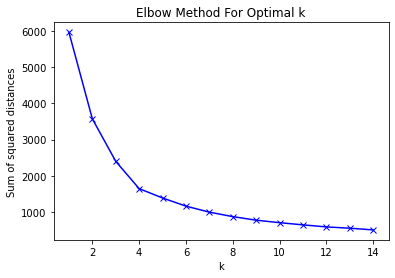

In [55]:
sum_of_squared_distances = []

# Create for loop
for k in range(1,15):
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(Tuesday)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot
plt.plot(range(1,15), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [56]:
kmeans_tuesday=KMeans(n_clusters=4, random_state=123)
kmeans_tuesday.fit(Tuesday)
pred_tuesday=kmeans_tuesday.predict(Tuesday)

In [65]:
df_moving_avg['cluster_Tuesday']= pred_tuesday

In [58]:
df_Wednesday=[df['W1'],df['W2'],df['W3'],df['W4'],df['W5'],df['W6'],df['W7'],df_moving_avg['W8']]
df_Wednesday=pd.DataFrame(df_Wednesday)
df_Wednesday=df_Wednesday.T
df_Wednesday

,W1,W2,W3,W4,W5,W6,W7,W8
0,5.0,3.0,5.0,6.0,7.0,6.0,4.0,7.0
1,3.0,6.0,5.0,7.0,5.0,6.0,6.0,5.0
2,5.0,4.0,6.0,4.0,5.0,6.0,4.0,7.0
3,3.0,3.0,3.0,6.0,6.0,4.0,7.0,6.0
4,4.0,6.0,6.0,6.0,5.0,6.0,3.0,7.0
...,...,...,...,...,...,...,...,...
995,4.0,3.0,6.0,6.0,2.0,6.0,3.0,7.0
996,5.0,3.0,2.0,5.0,7.0,4.0,6.0,3.0
997,1.0,4.0,4.0,5.0,5.0,6.0,5.0,1.0
998,2.0,2.0,6.0,3.0,4.0,3.0,2.0,1.0


In [59]:
from sklearn.decomposition import PCA

# Feature matrix and target array
X = df_Wednesday

# PCA
pca = PCA(n_components=2)

# Fit and transform
principalComponents = pca.fit_transform(X)

# Print ratio of variance explained
print(pca.explained_variance_ratio_)

[0.21189861 0.15583519]


In [60]:
Wednesday=pd.DataFrame(principalComponents)

In [61]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For loop
for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters)
    # Fit and predict your k-Means object
    preds = kmeans.fit_predict(Wednesday)
    score = silhouette_score(Wednesday, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.33476686777898124)
For n_clusters = 3, silhouette score is 0.3515560744892495)
For n_clusters = 4, silhouette score is 0.35858993268187456)
For n_clusters = 5, silhouette score is 0.3456665383687784)
For n_clusters = 6, silhouette score is 0.34714095106684495)
For n_clusters = 7, silhouette score is 0.34602720271319454)
For n_clusters = 8, silhouette score is 0.3416421253460187)
For n_clusters = 9, silhouette score is 0.34063155837581555)


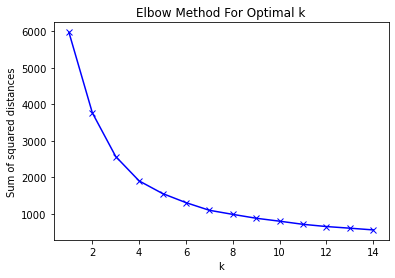

In [62]:
sum_of_squared_distances = []

# Create for loop
for k in range(1,15):
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(Wednesday)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot
plt.plot(range(1,15), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [63]:
kmeans_wednesday=KMeans(n_clusters=4, random_state=123)
kmeans_wednesday.fit(Wednesday)
pred_wednesday=kmeans_wednesday.predict(Wednesday)

In [66]:
df_moving_avg['cluster_Wednesday']= pred_wednesday

In [67]:
df_Thursday=[df['TH1'],df['TH2'],df['TH3'],df['TH4'],df['TH5'],df['TH6'],df['TH7'],df_moving_avg['TH8']]
df_Thursday=pd.DataFrame(df_Thursday)
df_Thursday=df_Thursday.T
df_Thursday

,TH1,TH2,TH3,TH4,TH5,TH6,TH7,TH8
0,6.0,4.0,6.0,7.0,7.0,7.0,5.0,8.0
1,4.0,6.0,6.0,7.0,6.0,7.0,7.0,6.0
2,6.0,5.0,7.0,5.0,6.0,7.0,5.0,8.0
3,4.0,4.0,4.0,7.0,7.0,5.0,7.0,7.0
4,5.0,6.0,7.0,7.0,6.0,7.0,4.0,8.0
...,...,...,...,...,...,...,...,...
995,5.0,3.0,6.0,7.0,3.0,7.0,4.0,7.0
996,5.0,4.0,2.0,6.0,7.0,4.0,6.0,3.0
997,2.0,5.0,5.0,5.0,6.0,6.0,5.0,2.0
998,2.0,2.0,7.0,4.0,5.0,3.0,3.0,2.0


In [68]:
from sklearn.decomposition import PCA

# Feature matrix and target array
X = df_Thursday

# PCA
pca = PCA(n_components=2)

# Fit and transform
principalComponents = pca.fit_transform(X)

# Print ratio of variance explained
print(pca.explained_variance_ratio_)

[0.2691875  0.13968917]


In [69]:
Thursday=pd.DataFrame(principalComponents)

In [70]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For loop
for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters)
    # Fit and predict your k-Means object
    preds = kmeans.fit_predict(Thursday)
    score = silhouette_score(Thursday, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.4282859465068519)
For n_clusters = 3, silhouette score is 0.38938298398804727)
For n_clusters = 4, silhouette score is 0.36209558224988564)
For n_clusters = 5, silhouette score is 0.3573727596326165)
For n_clusters = 6, silhouette score is 0.3524780926935882)
For n_clusters = 7, silhouette score is 0.352804908019335)
For n_clusters = 8, silhouette score is 0.3586488589787432)
For n_clusters = 9, silhouette score is 0.36398306858647284)


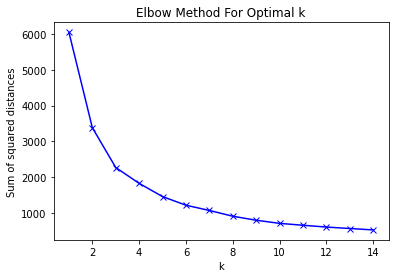

In [71]:
sum_of_squared_distances = []

# Create for loop
for k in range(1,15):
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(Thursday)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot
plt.plot(range(1,15), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [72]:
kmeans_thursday=KMeans(n_clusters=2, random_state=123)
kmeans_thursday.fit(Thursday)
pred_thursday=kmeans_thursday.predict(Thursday)

In [73]:
df_moving_avg['cluster_Thursday']= pred_thursday

In [74]:
df_Friday=[df['F1'],df['F2'],df['F3'],df['F4'],df['F5'],df['F6'],df['F7'],df_moving_avg['F8']]
df_Friday=pd.DataFrame(df_Friday)
df_Friday=df_Friday.T
df_Friday

,F1,F2,F3,F4,F5,F6,F7,F8
0,7.0,5.0,7.0,7.0,7.0,8.0,6.0,8.0
1,5.0,7.0,7.0,7.0,7.0,8.0,8.0,7.0
2,7.0,6.0,7.0,6.0,7.0,8.0,6.0,8.0
3,5.0,5.0,5.0,7.0,7.0,6.0,8.0,8.0
4,6.0,7.0,7.0,7.0,7.0,8.0,5.0,8.0
...,...,...,...,...,...,...,...,...
995,5.0,3.0,6.0,7.0,4.0,7.0,4.0,8.0
996,7.0,5.0,3.0,7.0,7.0,5.0,7.0,6.0
997,3.0,5.0,5.0,5.0,6.0,7.0,5.0,2.0
998,3.0,2.0,7.0,5.0,6.0,3.0,3.0,2.0


In [75]:
from sklearn.decomposition import PCA

# Feature matrix and target array
X = df_Friday

# PCA
pca = PCA(n_components=2)

# Fit and transform
principalComponents = pca.fit_transform(X)

# Print ratio of variance explained
print(pca.explained_variance_ratio_)

[0.35800149 0.13177349]


In [76]:
Friday=pd.DataFrame(principalComponents)

In [77]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For loop
for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters)
    # Fit and predict your k-Means object
    preds = kmeans.fit_predict(Friday)
    score = silhouette_score(Friday, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.5667294650942096)
For n_clusters = 3, silhouette score is 0.42940805721223113)
For n_clusters = 4, silhouette score is 0.4115328067501167)
For n_clusters = 5, silhouette score is 0.400786347815177)
For n_clusters = 6, silhouette score is 0.39721086262748245)
For n_clusters = 7, silhouette score is 0.38275123757404766)
For n_clusters = 8, silhouette score is 0.37324017901824674)
For n_clusters = 9, silhouette score is 0.3595995684986107)


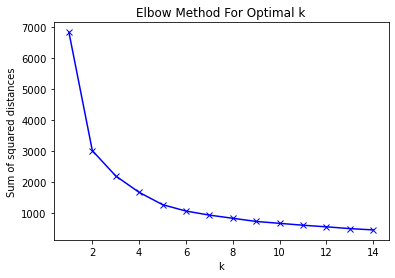

In [78]:
sum_of_squared_distances = []

# Create for loop
for k in range(1,15):
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(Friday)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot
plt.plot(range(1,15), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [79]:
kmeans_friday=KMeans(n_clusters=2, random_state=123)
kmeans_friday.fit(Friday)
pred_friday=kmeans_friday.predict(Friday)

In [80]:
df_moving_avg['cluster_Friday']= pred_friday

In [81]:
from sklearn.ensemble import RandomForestRegressor

In [100]:
clf_m = RandomForestRegressor()
clf_t=RandomForestRegressor()
clf_w=RandomForestRegressor()
clf_th=RandomForestRegressor()
clf_f=RandomForestRegressor()

In [107]:
clf=RandomForestRegressor()

In [114]:
clf_m.fit(df_moving_avg.drop('M8',axis=1),(df_moving_avg.M8))

RandomForestRegressor()

In [115]:
from sklearn.metrics import r2_score
r2_score(df_moving_avg.M8,clf_m.predict(df_moving_avg.drop('M8',axis=1)))

0.9000912990213242

In [90]:
df_moving_avg

,M8,T8,W8,TH8,F8,cluster_Monday,cluster_Tuesday,cluster_Wednesday,cluster_Thursday,cluster_Friday
0,5.0,6.0,7.0,8.0,8.0,0,1,1,0,0
1,3.0,6.0,5.0,6.0,7.0,0,0,1,0,0
2,5.0,6.0,7.0,8.0,8.0,2,0,3,0,0
3,4.0,5.0,6.0,7.0,8.0,2,1,1,0,0
4,4.0,6.0,7.0,8.0,8.0,0,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...
995,6.0,6.0,7.0,7.0,8.0,0,0,3,0,1
996,3.0,4.0,3.0,3.0,6.0,1,1,2,1,0
997,1.0,1.0,1.0,2.0,2.0,1,2,0,1,1
998,1.0,1.0,1.0,2.0,2.0,0,3,0,1,1


# PREDICTION

In [125]:
clf_t.fit(df_moving_avg.drop('T8',axis=1),(df_moving_avg.T8))

RandomForestRegressor()

In [126]:
from sklearn.metrics import r2_score
r2_score(df_moving_avg.T8,clf_t.predict(df_moving_avg.drop('T8',axis=1)))

0.959353919088805

In [127]:
clf_w.fit(df_moving_avg.drop('W8',axis=1),(df_moving_avg.W8))

RandomForestRegressor()

In [128]:
from sklearn.metrics import r2_score
r2_score(df_moving_avg.W8,clf_w.predict(df_moving_avg.drop('W8',axis=1)))

0.9341670203449713

In [129]:
clf_th.fit(df_moving_avg.drop('TH8',axis=1),(df_moving_avg.TH8))

RandomForestRegressor()

In [130]:
from sklearn.metrics import r2_score
r2_score(df_moving_avg.TH8,clf_th.predict(df_moving_avg.drop('TH8',axis=1)))

0.9478737599971048

In [131]:
clf_f.fit(df_moving_avg.drop('F8',axis=1),(df_moving_avg.F8))

RandomForestRegressor()

In [132]:
from sklearn.metrics import r2_score
r2_score(df_moving_avg.F8,clf_f.predict(df_moving_avg.drop('F8',axis=1)))

0.9535155514057496

In [133]:
M=clf_m.predict(df_moving_avg.drop('M8',axis=1))
T=clf_t.predict(df_moving_avg.drop('T8',axis=1))
W=clf_w.predict(df_moving_avg.drop('W8',axis=1))
TH=clf_th.predict(df_moving_avg.drop('TH8',axis=1))
F=clf_f.predict(df_moving_avg.drop('F8',axis=1))

In [134]:
a=[M,T,W,TH,F]
b=pd.DataFrame(a)
b_final=b.round(0)
c=b_final.T
c

,0,1,2,3,4
0,5.0,6.0,6.0,8.0,8.0
1,3.0,6.0,5.0,6.0,7.0
2,4.0,6.0,7.0,8.0,8.0
3,4.0,5.0,6.0,7.0,8.0
4,4.0,6.0,7.0,8.0,8.0
...,...,...,...,...,...
995,6.0,6.0,7.0,7.0,8.0
996,3.0,4.0,3.0,3.0,6.0
997,1.0,1.0,1.0,2.0,2.0
998,1.0,1.0,1.0,2.0,2.0


In [135]:
c.to_excel('Week9_pred.xlsx')

In [136]:
df_moving_avg.to_excel('Week8_imp.xlsx')

In [141]:
Binomial_data=df_moving_avg[['M8','T8','W8','TH8','F8']].T

In [142]:
import seaborn as sns

# BINOMIAL DISTRIBUTION

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

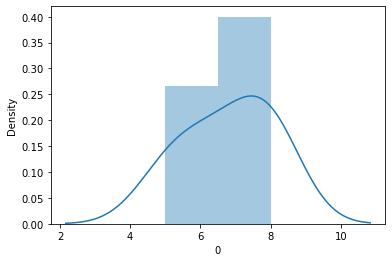

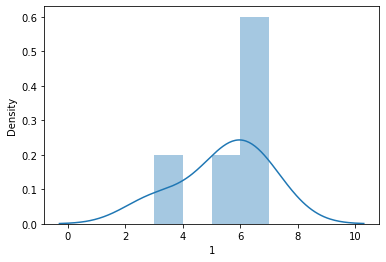

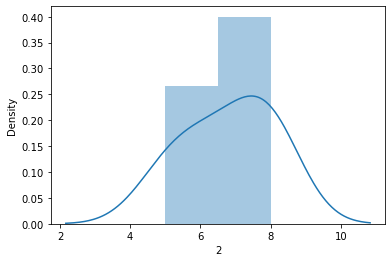

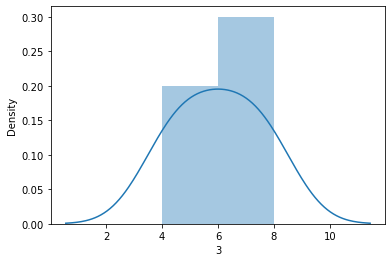

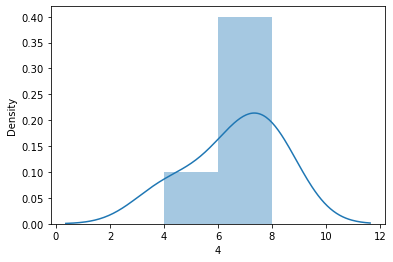

...

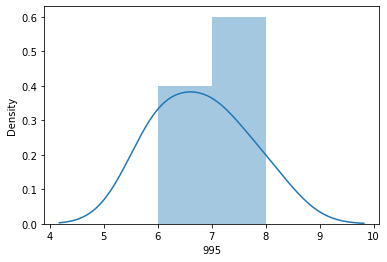

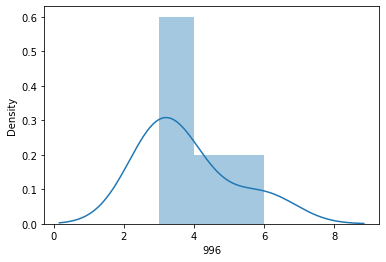

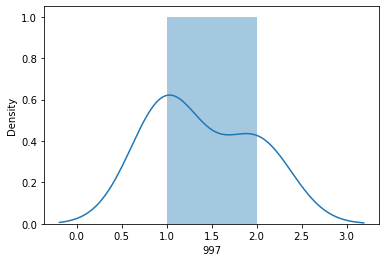

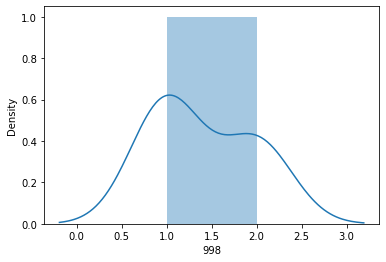

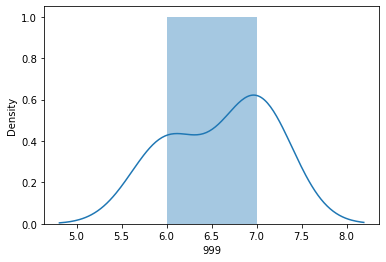

In [143]:
for i in Binomial_data:
    plt.figure()
    sns.distplot(Binomial_data[i],kde=True)

In [149]:
Bi_mean=Binomial_data.mean()

# BINOMIAL TREND

<AxesSubplot:>

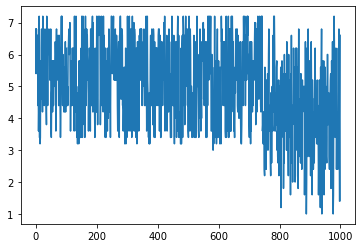

In [150]:
Bi_mean.plot.line()

In [144]:
distribution=pd.read_excel('Week8_distribution.xlsx')

In [151]:
Po_mean=distribution.mean()

In [171]:
a=np.array(Po_mean)
Po_plot=pd.DataFrame(a)

# POISSON TREND

{'whiskers': [<matplotlib.lines.Line2D at 0x20cd5d80550>,
 'caps': [<matplotlib.lines.Line2D at 0x20cd5d80c10>,
 'boxes': [<matplotlib.lines.Line2D at 0x20cd5d801f0>,
 'medians': [<matplotlib.lines.Line2D at 0x20cd5d8b310>,
 'fliers': [<matplotlib.lines.Line2D at 0x20cd5d8b670>,
 'means': []}

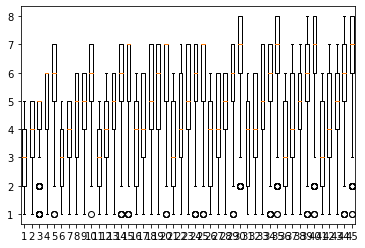

In [170]:
plt.boxplot(distribution)

# POISSON DISTRIBUTION

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 

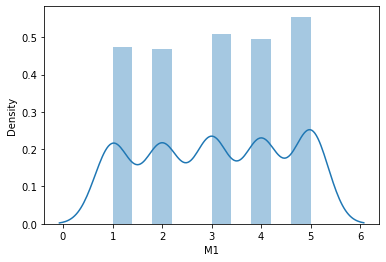

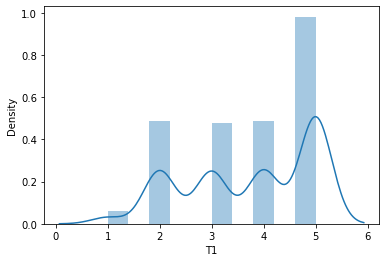

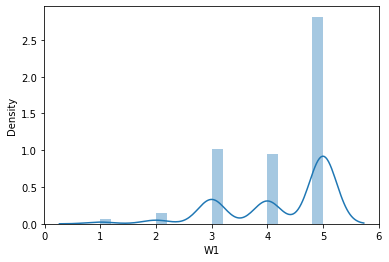

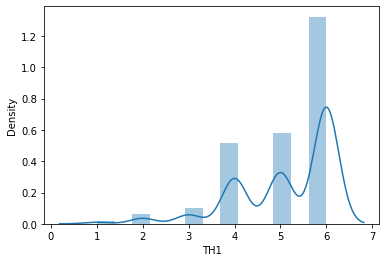

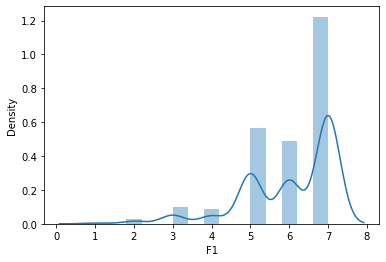

...

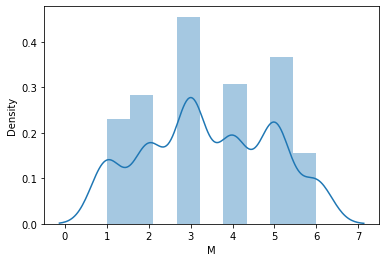

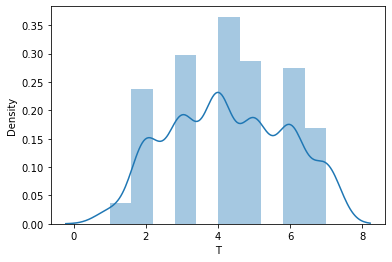

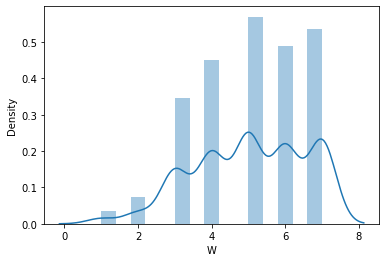

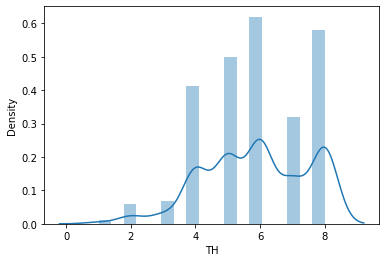

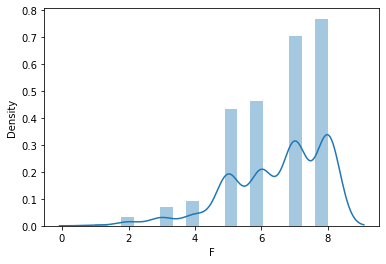

In [172]:
for i in distribution:
    plt.figure()
    sns.distplot(distribution[i],kde=True)

In [173]:
df1.isnull().sum()

M8     176
T8     184
W8     194
TH8    196
F8     207
dtype: int64

# BERNOULLI DISTRIBUTION

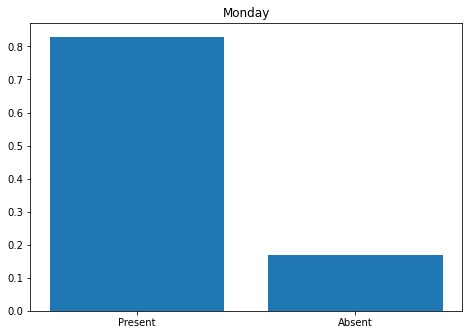

In [174]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['Present','Absent']
students = [0.83,0.17]
ax.bar(langs,students)
plt.title('Monday')
plt.show()

In [175]:
from scipy.stats import norm

In [176]:
df_Monday=[df['M1'],df['M2'],df['M3'],df['M4'],df['M5'],df['M6'],df['M7']]
df_m1=np.array(df_Monday)
df_m1.mean(),df_m1.std()

(3.3065714285714285, 1.6138727916893272)

# NORMAL DISTRIBUTION

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Monday')

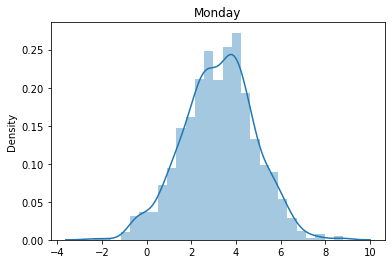

In [177]:
Normal_Monday=norm.rvs(size=1000,loc=3.3,scale=1.6)
sns.distplot(Normal_Monday,kde=True)
plt.title('Monday')

In [178]:
df_Monday=[df['M1'],df['M2'],df['M3'],df['M4'],df['M5'],df['M6'],df['M7'],df_moving_avg['M8']]
df_m1=np.array(df_Monday)
df_m1.mean(),df_m1.std()

(3.32225, 1.6096288197904507)

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Monday')

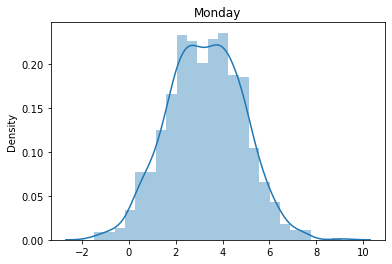

In [180]:
Normal_Monday=norm.rvs(size=1000,loc=3.32,scale=1.61)
sns.distplot(Normal_Monday,kde=True)
plt.title('Monday')

In [179]:
df_Monday=[df['M1'],df['M2'],df['M3'],df['M4'],df['M5'],df['M6'],df['M7'],df_moving_avg['M8'],c[0]]
df_m1=np.array(df_Monday)
df_m1.mean(),df_m1.std()

(3.3338888888888887, 1.5983902975211894)

F:\DataScience\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Monday')

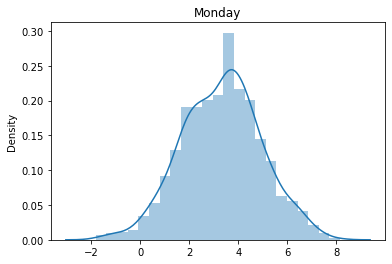

In [181]:
Normal_Monday=norm.rvs(size=1000,loc=3.33,scale=1.6)
sns.distplot(Normal_Monday,kde=True)
plt.title('Monday')